In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "utils")))
from analysis_utils import (
    volcano_plot_br,
    plot_spatial_clusters_per_sample,
    plot_dotplot_by_treatment,
    plot_relative_cluster_composition
)
import scanpy as sc
import numpy as np

import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
ad = sc.read_h5ad('../data/ST_BRICHOS_region.h5ad')

In [7]:
ad

AnnData object with n_obs × n_vars = 25660 × 18751
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'sample_id', 'n_genes', 'leiden', 'treatment', 'barcode', 'region_annotation', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5'
    var: 'n_cells', 'mean', 'std'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'region_annotation_colors', 'sample_id_colors', 'spatial', 'spatial_metadata_per_sample', 'umap', 'leiden_0.5_colors', 'leiden_1_colors', 'leiden_1.5_colors', 'leiden_2_colors', 'leiden_2.5_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [30]:
resolutions = [0.5,0.75 ,1, 1.5 , 2, 2.5]
for resolution in resolutions: 
    print('clustering at resolution '+str(resolution))
    sc.tl.leiden(ad, resolution = resolution, key_added = 'leiden_'+str(resolution))
    print("done")

clustering at resolution 0.5
done
clustering at resolution 0.75
done
clustering at resolution 1
done
clustering at resolution 1.5
done
clustering at resolution 2
done
clustering at resolution 2.5
done


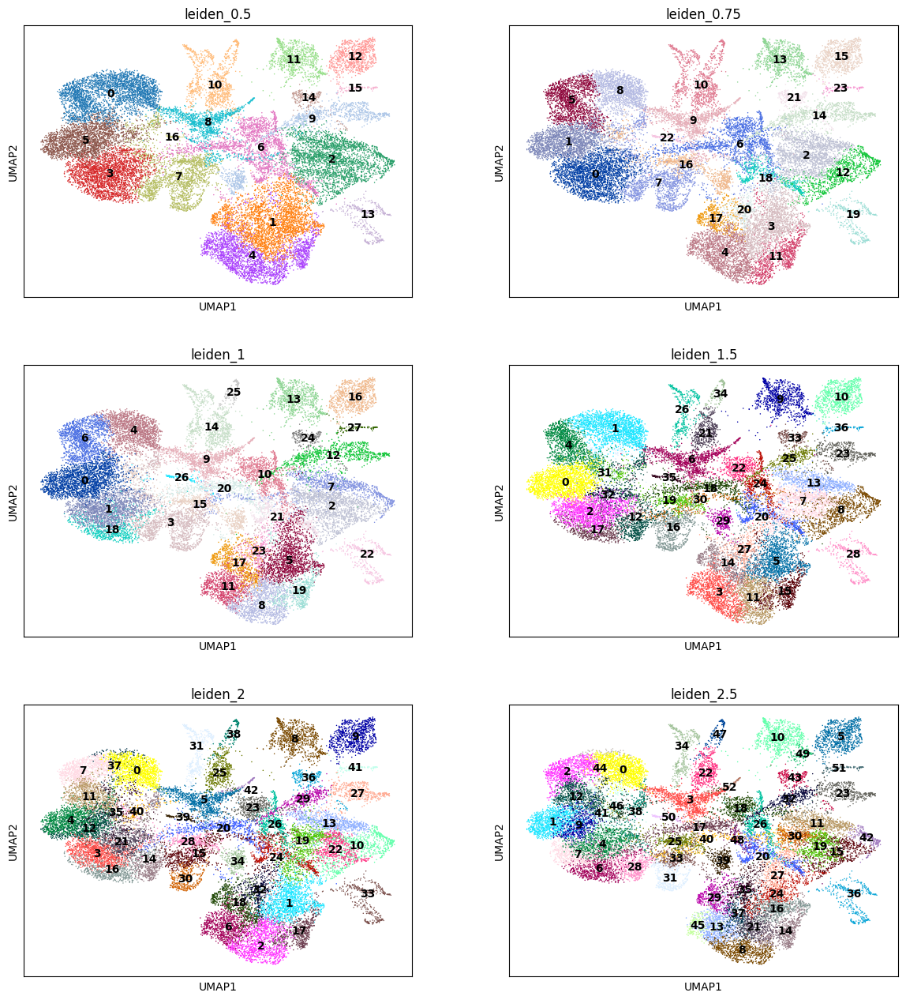

In [31]:
sc.pl.umap(ad, color=["leiden_0.5", "leiden_0.75","leiden_1", "leiden_1.5", "leiden_2","leiden_2.5"], legend_loc='on data', ncols=2)


📍 Plotting sample: P24215_301


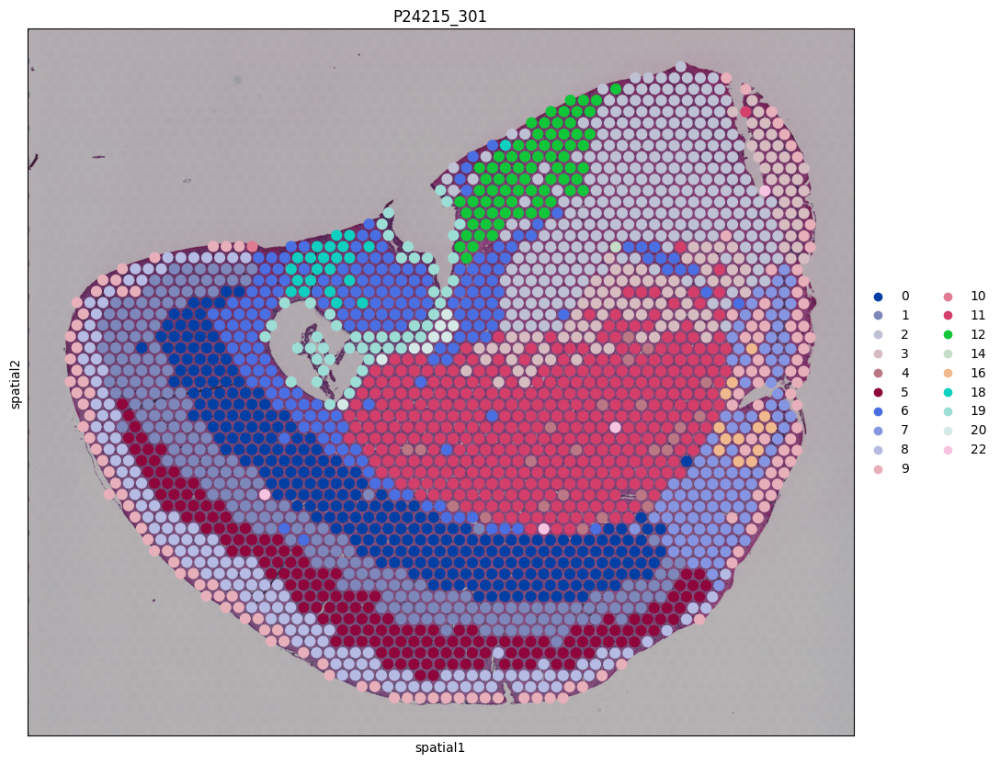

📍 Plotting sample: P28052_201


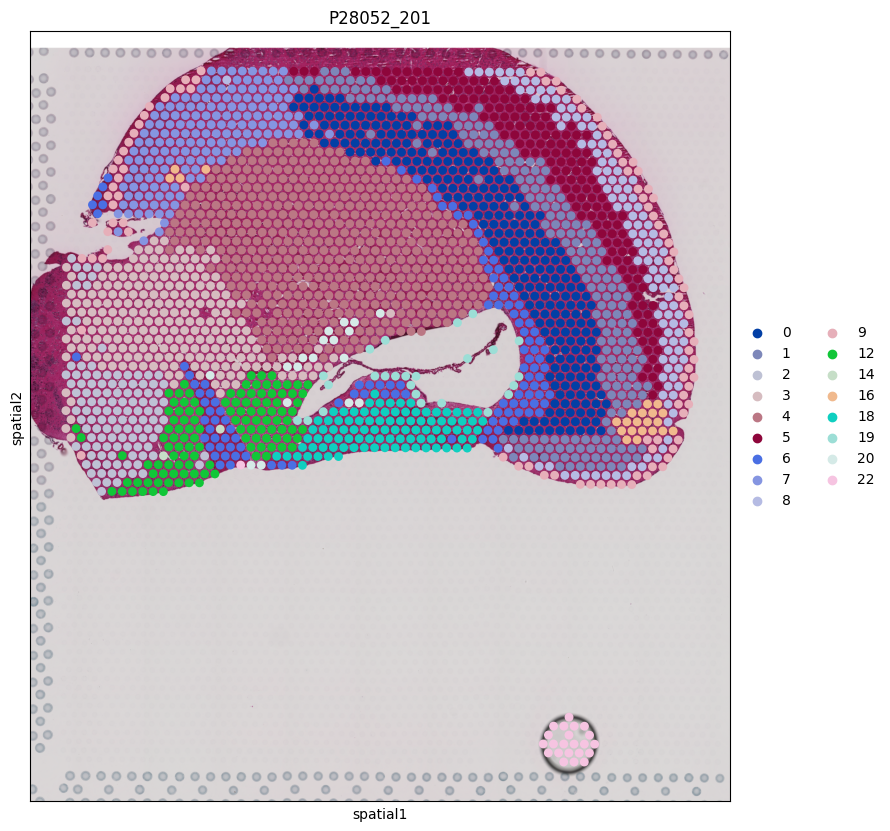

📍 Plotting sample: P24215_101


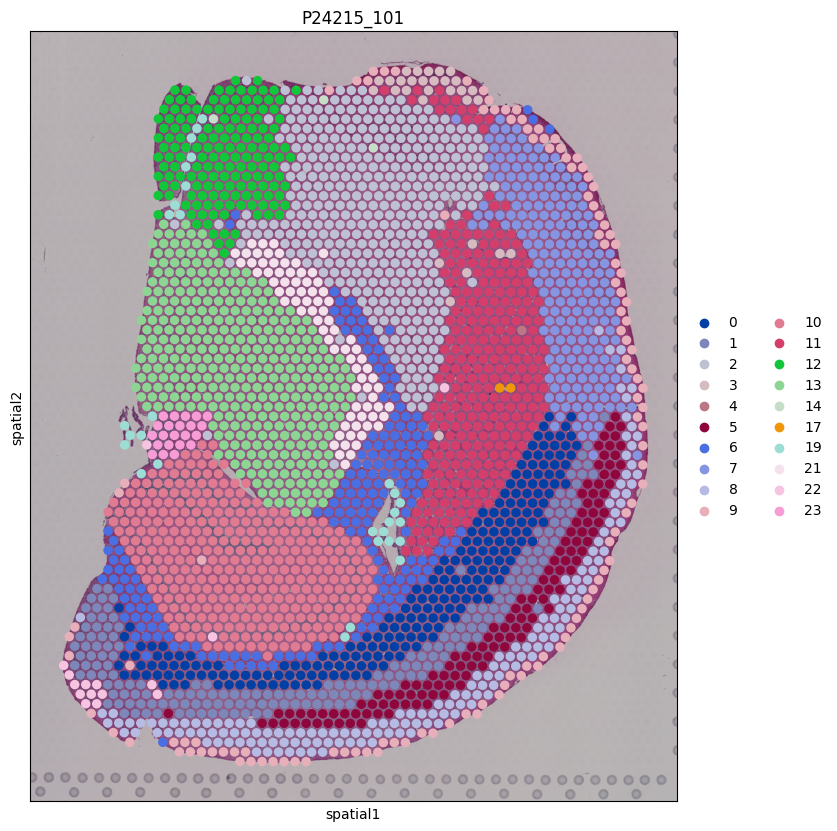

📍 Plotting sample: P28052_103


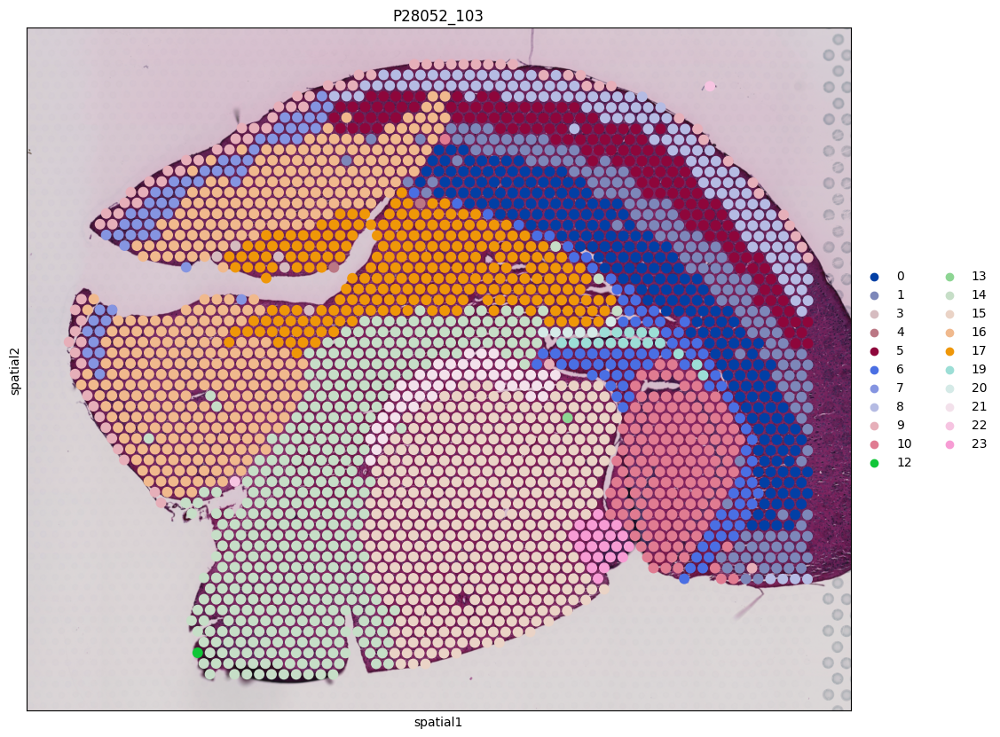

📍 Plotting sample: P28052_102


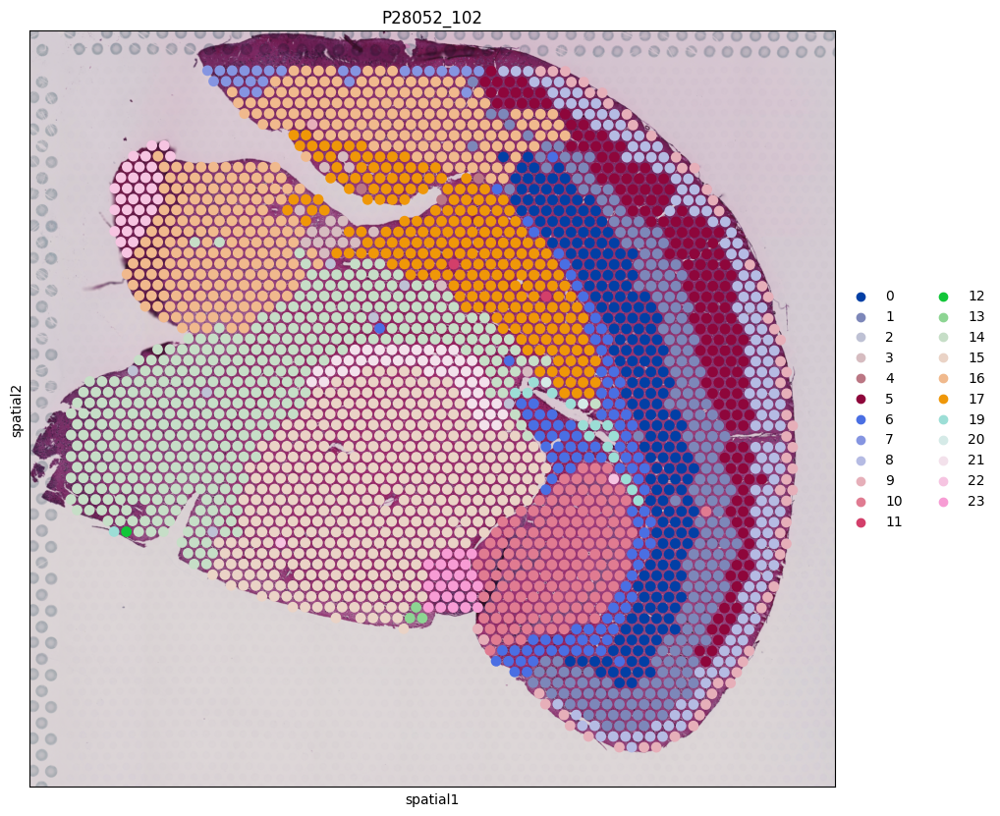

📍 Plotting sample: P28052_401


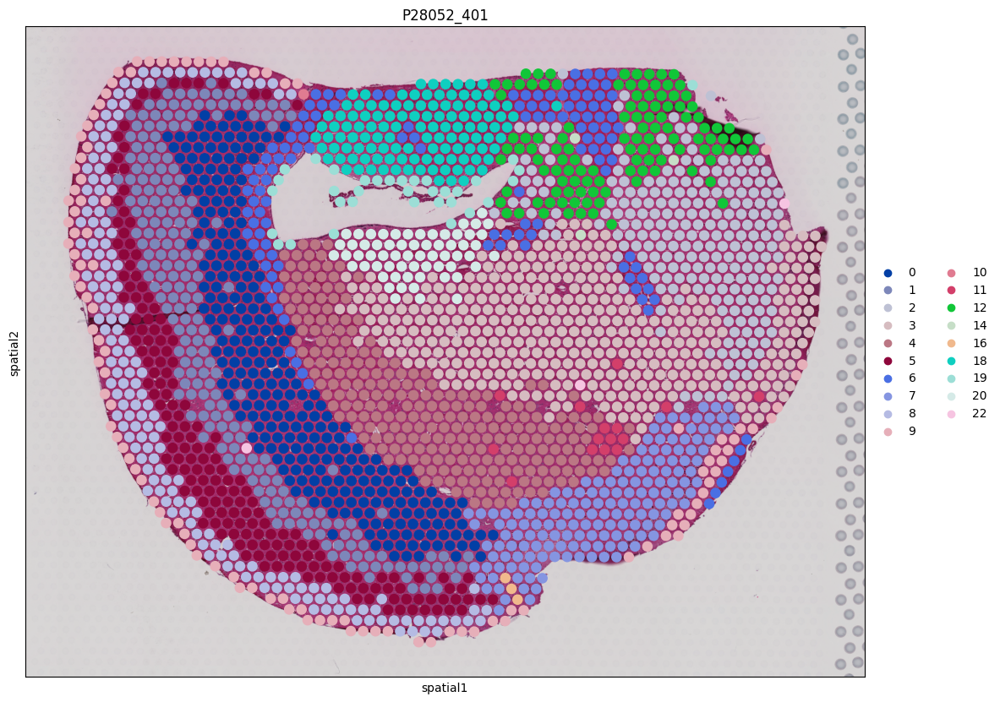

📍 Plotting sample: P24215_201


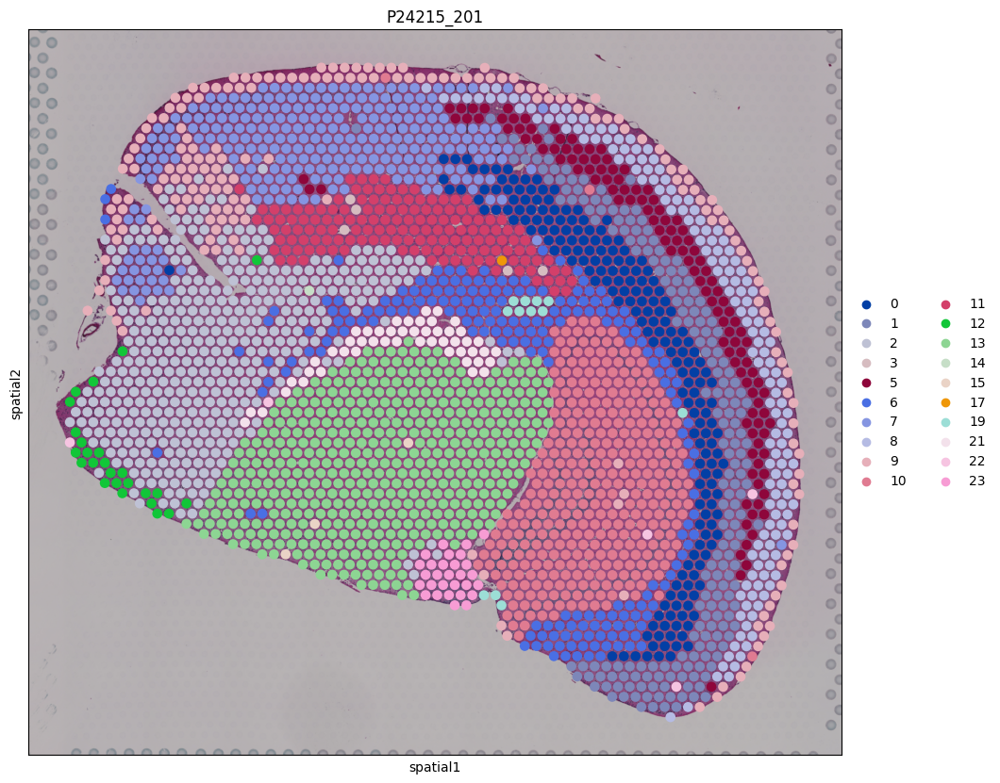

📍 Plotting sample: P28052_301


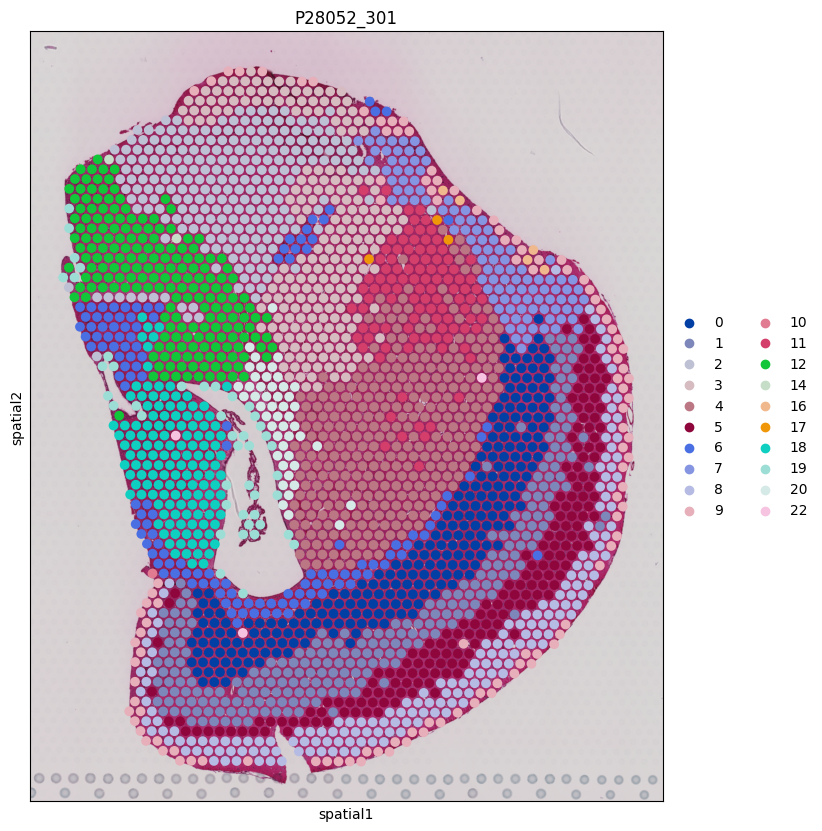

📍 Plotting sample: P28052_202


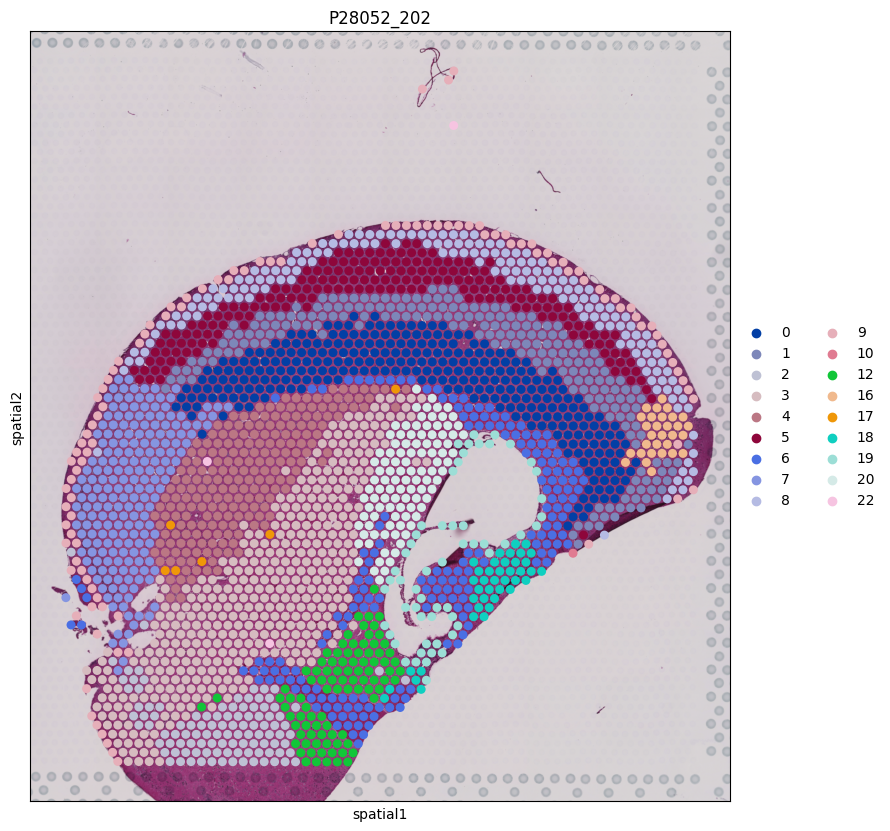

📍 Plotting sample: P28052_203


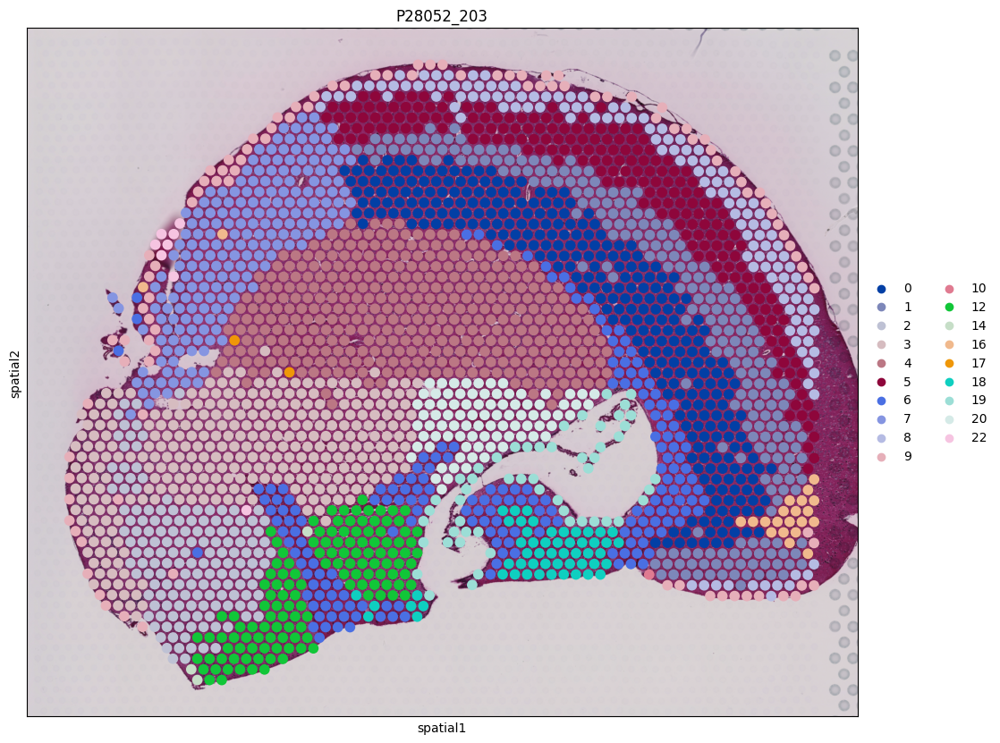

In [32]:
plot_spatial_clusters_per_sample(ad, color='leiden_0.75')

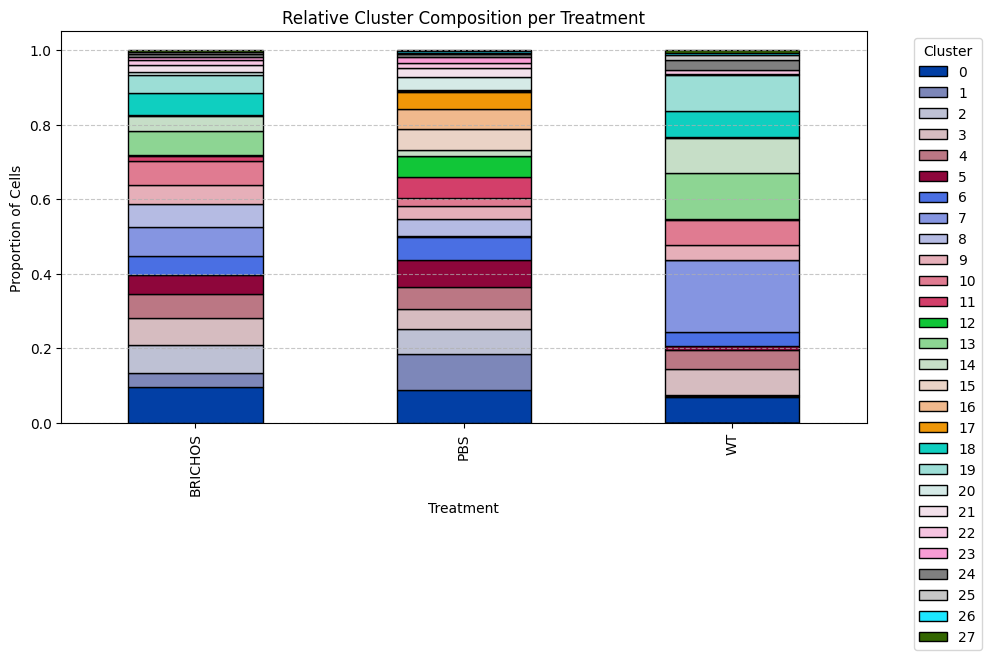

In [6]:
plot_relative_cluster_composition(ad, cluster_key="leiden_1")

In [25]:
sc.tl.rank_genes_groups(ad, groupby='leiden_1', method='wilcoxon')

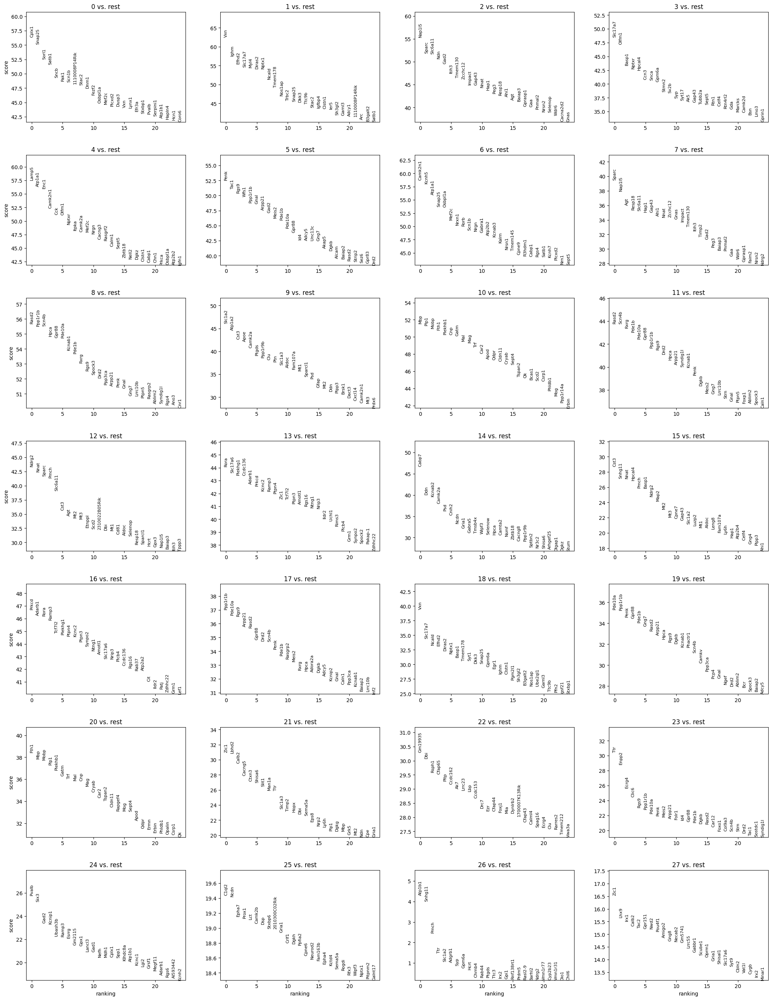

In [26]:
# See top 5 marker genes per cluster
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

In [27]:
marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:20]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
marker_genes.head()
#marker_genes.to_csv('../data/marker_genes.csv')

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,Cplx1,Vxn,Nap1l5,Slc17a7,Lamp5,Penk,Camk2n1,Sparc,Rasd2,Slc1a2,...,Vxn,Pde10a,Fth1,Zic1,Gm19935,Ttr,Pvalb,C1ql2,Atp1b1,Zic1
1,Snap25,Ighm,Sparc,Olfm1,Atp1a1,Tac1,Kcnh5,Nap1l5,Ppp1r1b,Atp1a2,...,Slc17a7,Ppp1r1b,Mbp,Lbhd2,Dbi,Enpp2,Six3,Ncdn,Snhg11,Lhx9
2,Sorl1,Efhd2,Slc6a11,Basp1,Enc1,Rgs9,Atp1a1,Agt,Scn4b,Cst3,...,Ncald,Penk,Mobp,Calb2,Rsph1,Ecrg4,Gad2,Epha7,Pmch,Irx1
3,Satb1,Slc17a7,Ndn,Nptxr,Camk2n1,Wfs1,Snap25,Resp18,Hpca,Apoe,...,Efhd2,Gpr88,Plp1,Cacng5,Cfap65,Clic6,Kcnip1,Prox1,Ttr,Calb2
4,Sncb,Myl4,Gad2,Hpcal4,Cck,Ppp1r1b,Osbpl1a,Slc6a11,Gpr88,Camk2a,...,Diras2,Pde1b,Plekhb1,Ctxn3,Pltp,Rgs9,Ubash3b,Lct,Slc1a2,Tac2


In [28]:
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

0
Cplx1 Snap25 Sorl1 Satb1 Sncb Pak1 Scn1b 1110008P14Rik Stac2 Dnm1 Fezf2 Osbpl1a Mef2c Plcxd2 Dusp3 Vxn Lynx1 Efr3a Stxbp1 Pvalb
 
1
Vxn Ighm Efhd2 Slc17a7 Myl4 Diras2 Nptx1 Ncald Tmem178 Nos1ap Trbc2 Snap25 Dkk3 Ttc9b Stac2 Igfbp4 Clstn1 Ier5 Sh3gl2 Garnl3
 
2
Nap1l5 Sparc Slc6a11 Ndn Gad2 Itih3 Tmem130 Zcchc12 Impact Gap43 Nnat Hap1 Peg3 Resp18 Ahi1 Agt Baiap3 Gprasp1 Gaa Pnmal2
 
3
Slc17a7 Olfm1 Basp1 Nptxr Hpcal4 Ccn3 Snca Gpm6a Stmn2 Sv2b Syp Syt17 Ak5 Gap43 Tubb2a Sept5 Rtn1 Celf4 Rtn4rl2 Gda
 
4
Lamp5 Atp1a1 Enc1 Camk2n1 Cck Olfm1 Nptxr Itpka Camk2a Mef2c Nrgn Cacng3 Rasgrf2 Calm1 Sept5 Zbtb18 Nell2 Dgkz Clstn1 Cabp1
 
5
Penk Tac1 Rgs9 Wfs1 Ppp1r1b Gnal Arpp21 Gad2 Meis2 Pde1b Pde10a Gpr88 Id4 Adcy5 Unc13c Gng7 Akap5 Dgkb Alcam Baiap2
 
6
Camk2n1 Kcnh5 Atp1a1 Snap25 Osbpl1a Mef2c Nrxn1 Rorb Scn1b Nrgn Gabra1 Atp2b2 Kcnab3 Kalrn Nrsn1 Tmem145 Cpne9 R3hdm1 Cabp1 Rgs4
 
7
Sparc Nap1l5 Agt Resp18 Slc6a11 Hap1 Gap43 Ahi1 Nnat Zcchc12 Gnas Impact Tmem130 Itih3 Timp2 Gad2 Peg3 Baiap3 

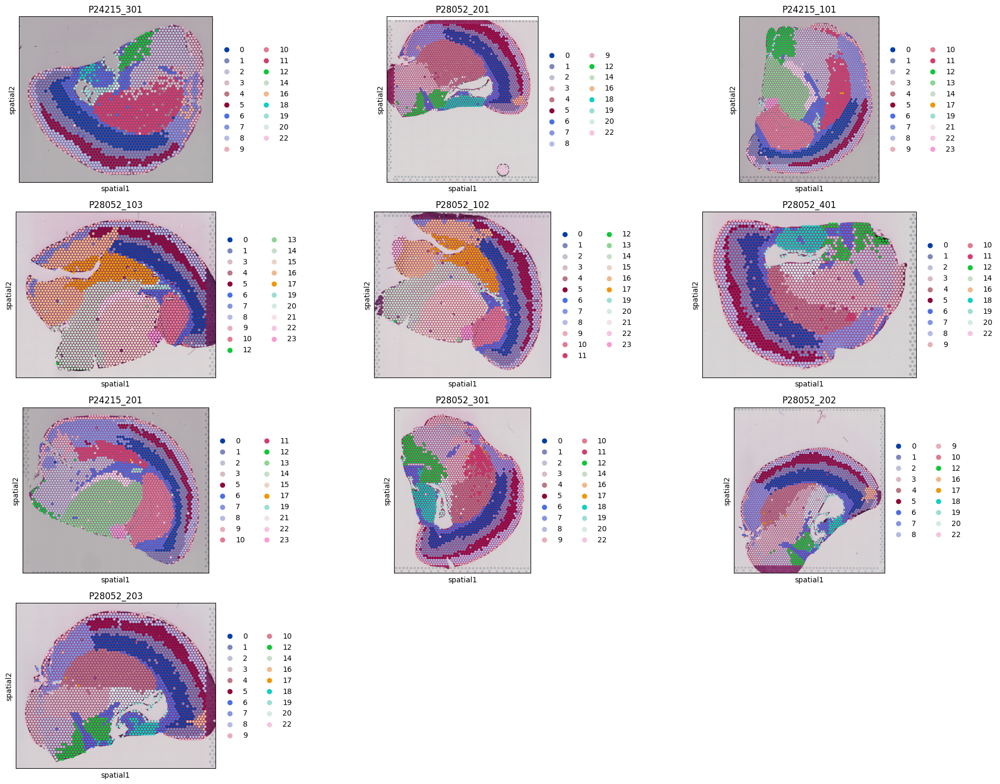

In [39]:
plot_spatial_clusters_per_sample(ad, color = 'leiden_0.75', figsize=(20,15))